In [1]:
import xarray as xr
import numpy as np
import numpy as np
import xarray as xr
import os
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import pandas as pd

/work/users/s233224/Climate-Change-Impacted-Solar-Energy-Generation/power/ACCESS-CM2_1x1grid/historical/
/work/users/s233224/Climate-Change-Impacted-Solar-Energy-Generation/power/CanESM5_1x1grid/historical/
/work/users/s233224/Climate-Change-Impacted-Solar-Energy-Generation/power/CMCC-CM2-SR5_1x1grid/historical/
/work/users/s233224/Climate-Change-Impacted-Solar-Energy-Generation/power/CMCC-ESM2_1x1grid/historical/
/work/users/s233224/Climate-Change-Impacted-Solar-Energy-Generation/power/HadGEM3-GC31-LL_1x1grid/historical/
/work/users/s233224/Climate-Change-Impacted-Solar-Energy-Generation/power/HadGEM3-GC31-MM_1x1grid/historical/
/work/users/s233224/Climate-Change-Impacted-Solar-Energy-Generation/power/MRI-ESM2-0_1x1grid/historical/


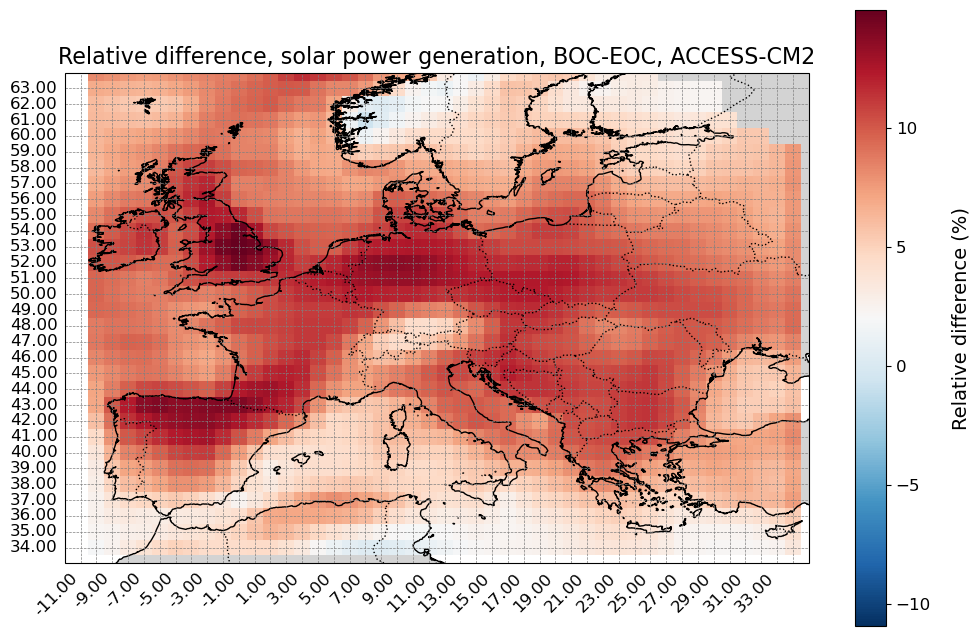

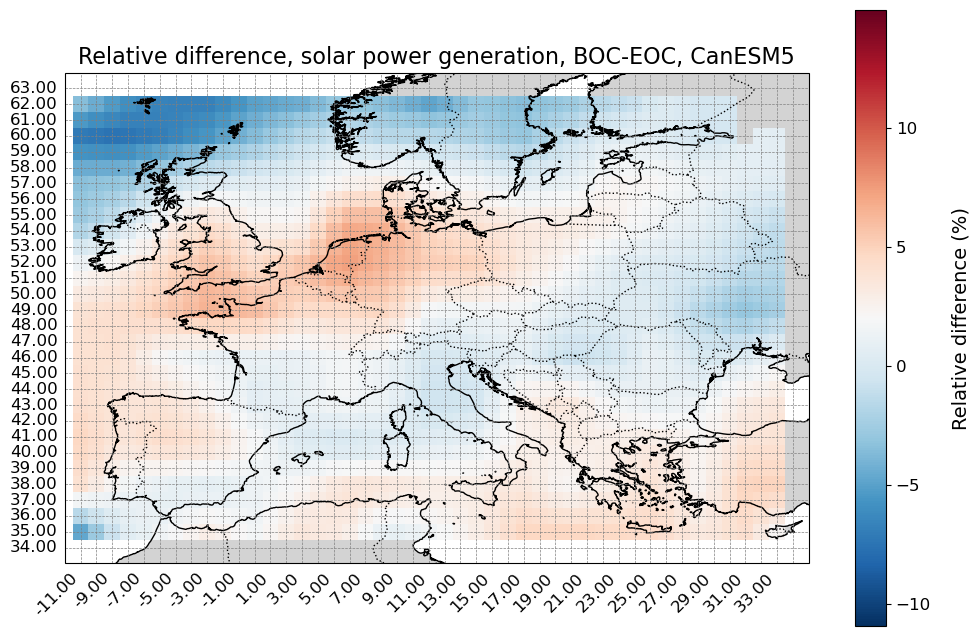

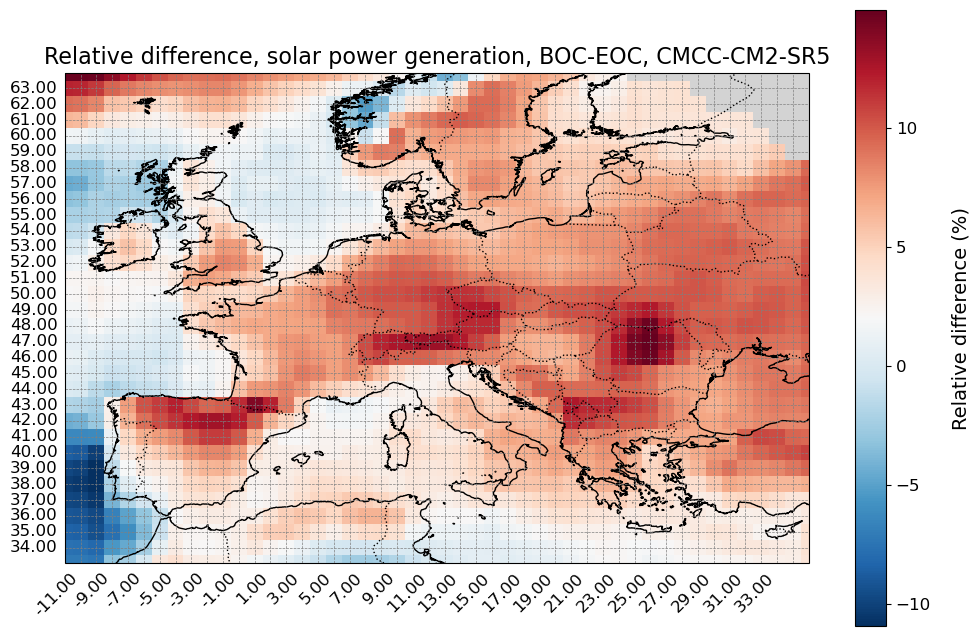

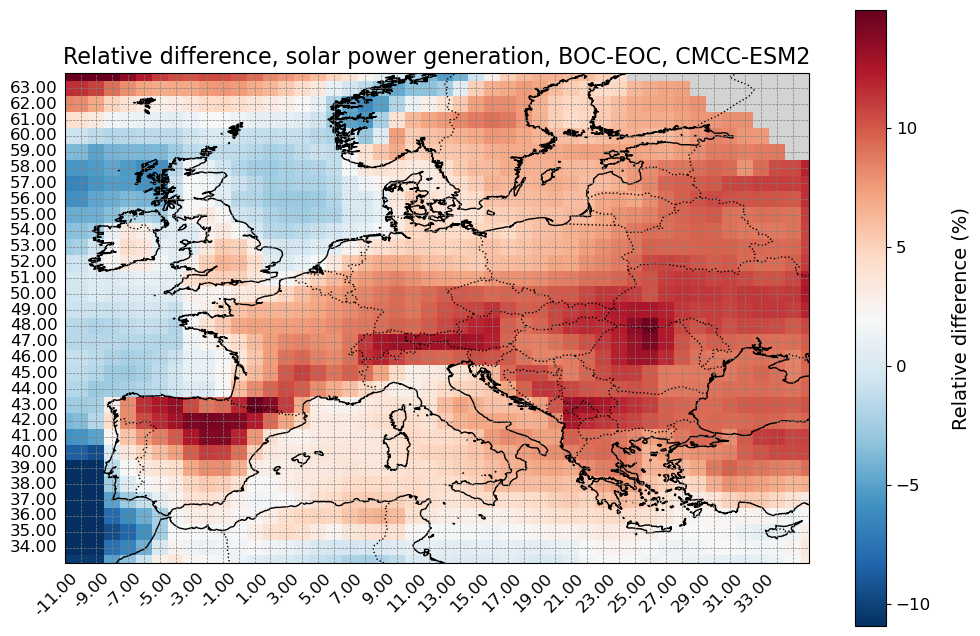

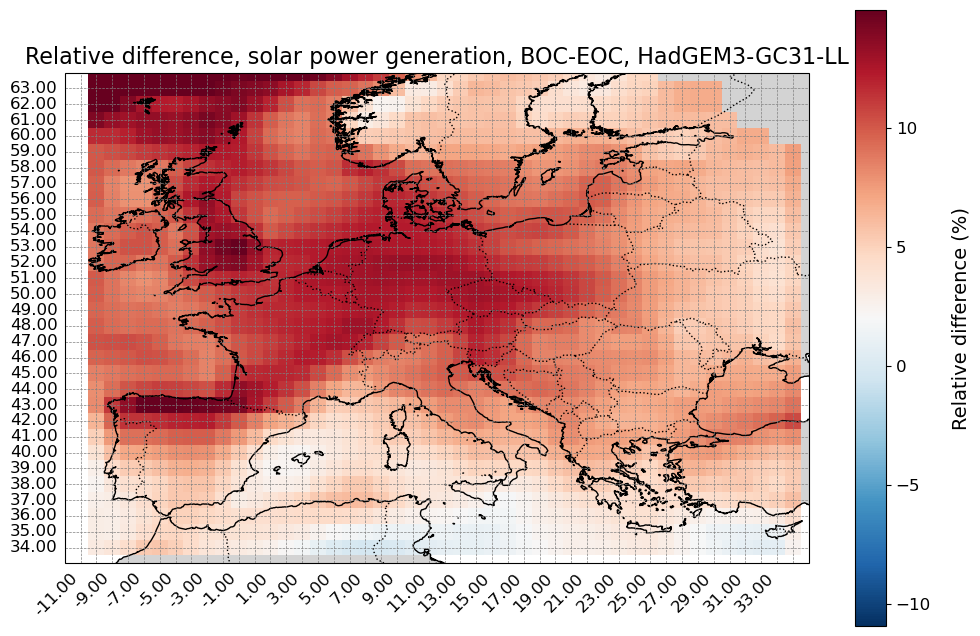

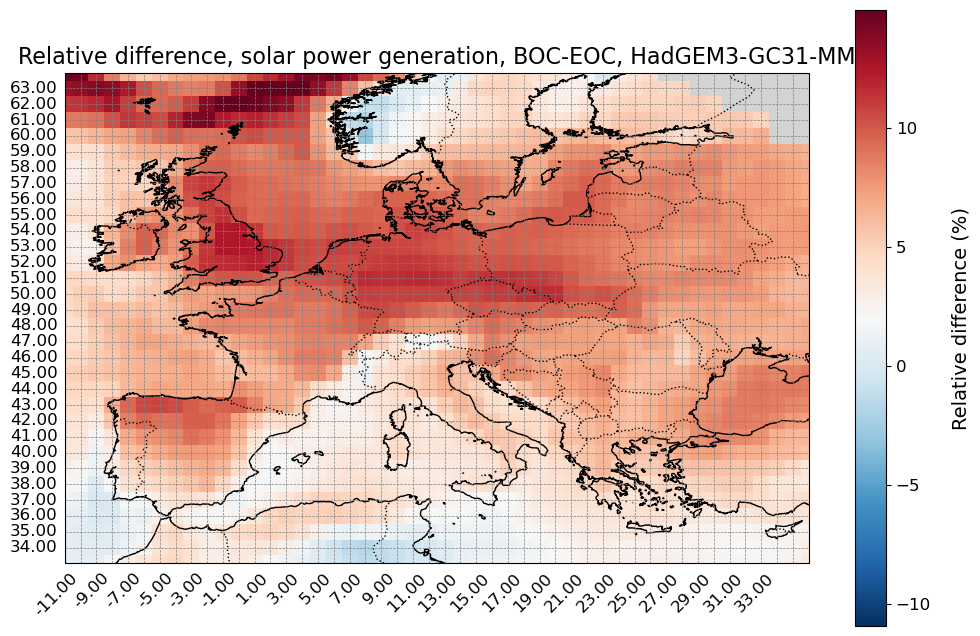

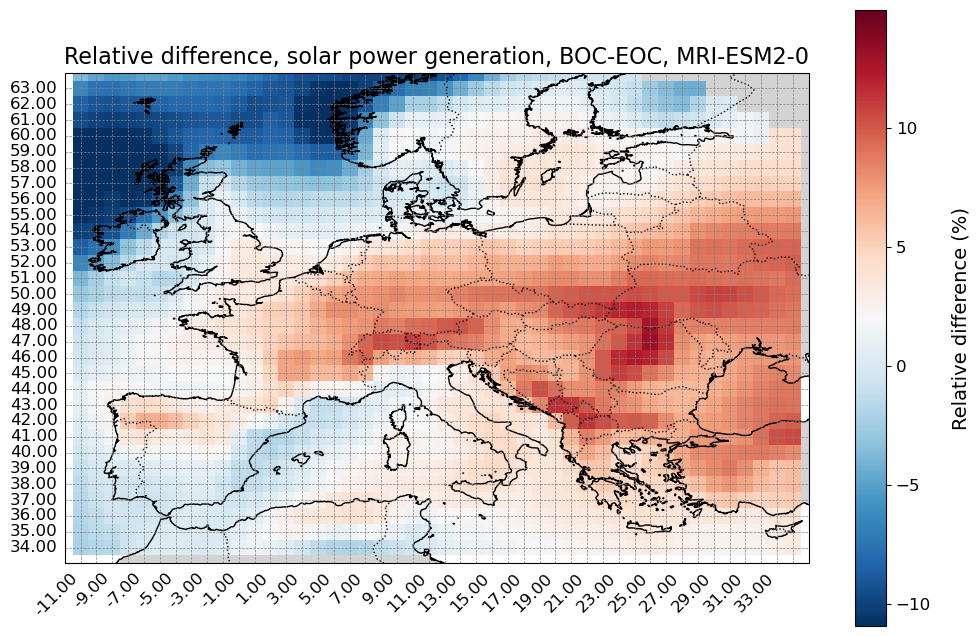

In [2]:
# Define the directory and models
models = ["ACCESS-CM2", "CanESM5", "CMCC-CM2-SR5", "CMCC-ESM2","HadGEM3-GC31-LL", "HadGEM3-GC31-MM", "MRI-ESM2-0"]  # Replace with actual model names
diri = "/work/users/s233224/Climate-Change-Impacted-Solar-Energy-Generation/power/"

# Initialize vmin and vmax
vmin = float("inf")
vmax = float("-inf")

# Dictionary to store relative differences for each model
relative_differences = {}
all_relative_differences = []

# Loop through each model
for model in models:
    # Define paths for BOC and EOC
    path_BOC = os.path.join(diri, model+"_1x1grid/historical/")
    print(path_BOC)
    path_EOC = os.path.join(diri, model+"_1x1grid/ssp585/")
    
    # Load BOC files
    files_BOC = [f"{path_BOC}aggregated_solar_power_{year}.nc" for year in range(1980, 2015)]
    datasets_BOC = []
    for year, file in zip(range(1980, 2015), files_BOC):
        ds_BOC = xr.open_dataset(file, engine="netcdf4")
        ds_BOC = ds_BOC.expand_dims(time=[year])
        datasets_BOC.append(ds_BOC)
    combined_ds_BOC = xr.concat(datasets_BOC, dim="time")
    mean_power_BOC = combined_ds_BOC["specific generation"].mean(dim="time")
    
    # Load EOC files
    files_EOC = [f"{path_EOC}aggregated_solar_power_{year}.nc" for year in range(2065, 2100)]
    datasets_EOC = []
    for year, file in zip(range(2065, 2100), files_EOC):
        ds_EOC = xr.open_dataset(file)
        ds_EOC = ds_EOC.expand_dims(time=[year])
        datasets_EOC.append(ds_EOC)
    combined_ds_EOC = xr.concat(datasets_EOC, dim="time")
    mean_power_EOC = combined_ds_EOC["specific generation"].mean(dim="time")
    
    # Calculate relative difference
    relative_difference = (mean_power_EOC - mean_power_BOC) / mean_power_BOC * 100
    relative_difference = relative_difference.sel(x=slice(-12, 35), y=slice(33, 65))
    relative_differences[model] = relative_difference
    # Collect all relative differences for global quantile calculation
    all_relative_differences.append(relative_difference)
    
    # Update vmin and vmax
    vmin = min(vmin, relative_difference.min().values)
    vmax = max(vmax, relative_difference.max().values)

# Combine all relative differences into a single array for quantile calculation
all_relative_differences_combined = xr.concat(all_relative_differences, dim="model")
q05, q995 = np.nanpercentile(all_relative_differences_combined, [0.5, 99.5])

for model, relative_difference in zip(models, all_relative_differences):
    relative_difference = relative_difference
    relative_differences[model] = relative_difference
    
    # Update vmin and vmax
    vmin = min(vmin, relative_difference.min().values)
    vmax = max(vmax, relative_difference.max().values)
    vmin,vmax = q05, q995
    

# Plot relative differences for each model
for model, relative_difference in relative_differences.items():
    from plots import map_plots
    
    map_plots(relative_difference,cmap='RdBu_r', setnan=False, vmin=vmin, vmax=vmax, title=f"Relative difference, solar power generation, BOC-EOC, {model}", label="Relative difference (%)")
    

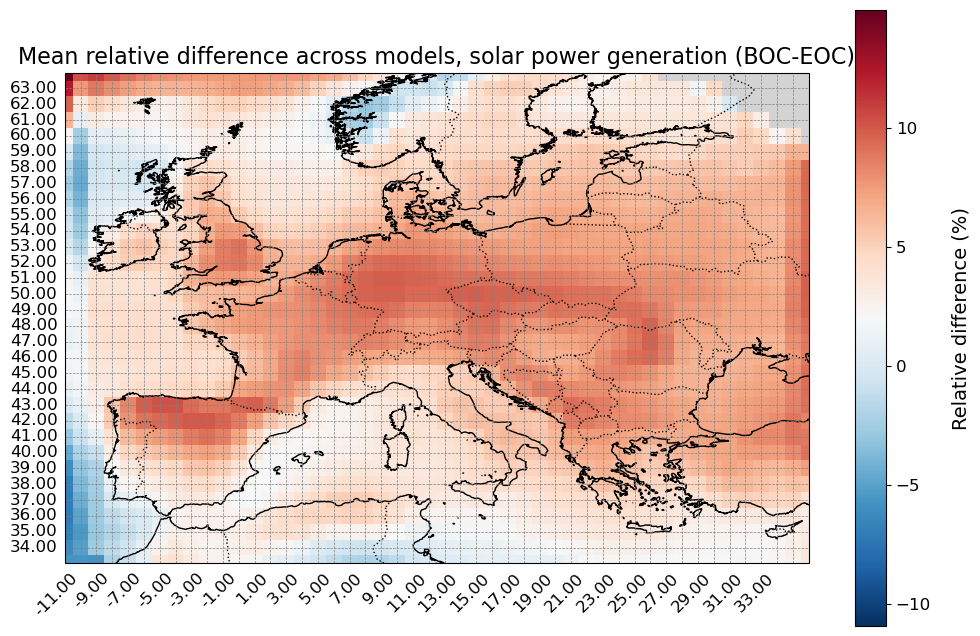

In [3]:
# 1) Compute the multi‐model mean
mean_rel_diff = all_relative_differences_combined.mean(dim="model")

# 2) Plot it with the same color‐limits you set before
from plots import map_plots

map_plots(
    mean_rel_diff,setnan=False,
    cmap='RdBu_r',
    vmin=q05,             # your 0.5th percentile
    vmax=q995,             # your 99.5th percentile
    title="Mean relative difference across models, solar power generation (BOC-EOC)",
    label="Relative difference (%)"
)


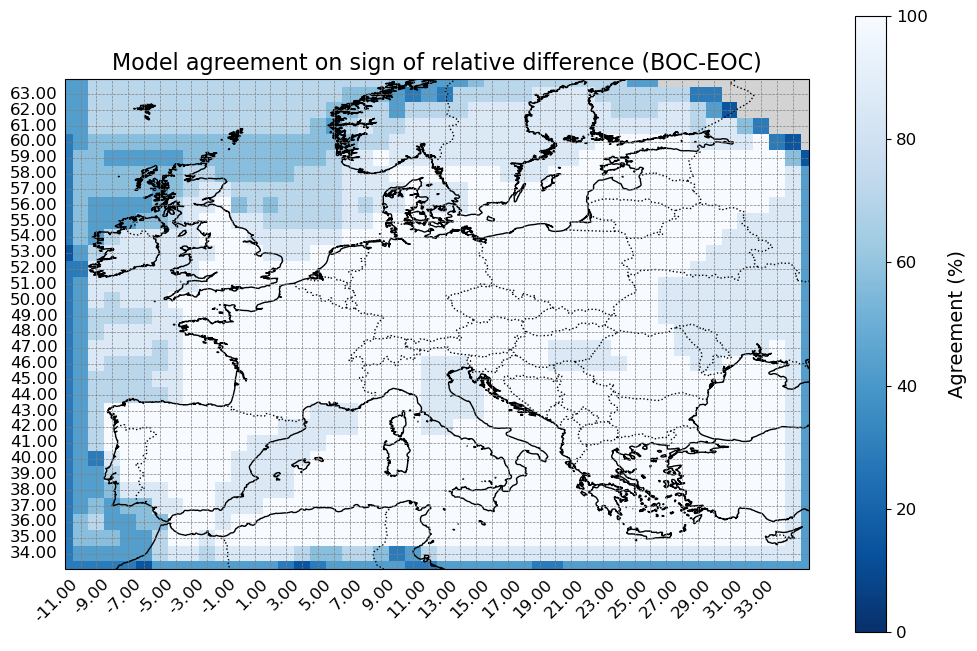

In [4]:
import pandas as pd
import numpy as np
import xarray as xr
from plots import map_plots

models = ["ACCESS-CM2", "CanESM5", "CMCC-CM2-SR5", "CMCC-ESM2",
          "HadGEM3-GC31-LL", "HadGEM3-GC31-MM", "MRI-ESM2-0"]

# 1) Stack all models into one DataArray with a "model" dimension
all_rel = xr.concat(
    [relative_differences[m] for m in models],
    dim=pd.Index(models, name="model")
)

# 2) Ensemble‐mean sign (+1 increase, -1 decrease)
ens_mean   = all_rel.mean(dim="model")
ens_sign   = np.sign(ens_mean)

# 3) Count how many models match that sign
model_signs   = np.sign(all_rel)
agreement_cnt = (model_signs == ens_sign).sum(dim="model")

# 4) Percentage agreement
sign_agreement_pct = agreement_cnt / len(models) * 100

# 5) Plot
map_plots(
    sign_agreement_pct,setnan=True,
    cmap="Blues_r",
    vmin=0, vmax=100,
    title='Model agreement on sign of relative difference (BOC-EOC)',
    label='Agreement (%)'
)


In [13]:
sign_agreement_pct.mean()

<xarray.DataArray 'specific generation' ()> Size: 8B
array(81.52056277)

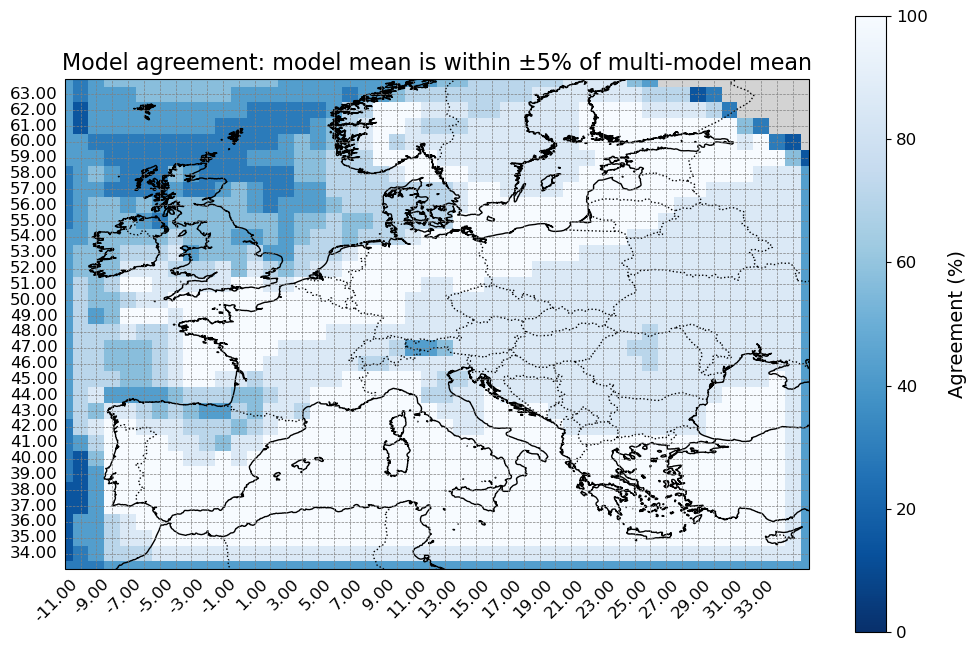

In [5]:
# 1. Stack into one DataArray [model, y, x]
all_rel = xr.concat(
    [relative_differences[m] for m in models],
    dim = pd.Index(models, name="model")
)

# 2. Compute the multi‐model mean
ens_mean = all_rel.mean(dim="model")

# 3. Define your tolerance (e.g. ±5 % absolute difference)
tol = 5.0

# 4. Count how many models fall within ±tol of the mean
within_tol = (np.abs(all_rel - ens_mean) <= tol).sum(dim="model")

# 5. Convert to percent agreement
agreement_mag = within_tol / all_rel.sizes["model"] * 100

# 6. Plot that
map_plots(
    agreement_mag,
    cmap="Blues_r",
    setnan=True,
    vmin=0, vmax=100,
    title=f"Model agreement: model mean is within ±{tol:.0f}% of multi-model mean",
    label="Agreement (%)"
)


In [36]:
agreement_mag.mean()

<xarray.DataArray 'specific generation' ()> Size: 8B
array(76.41594517)

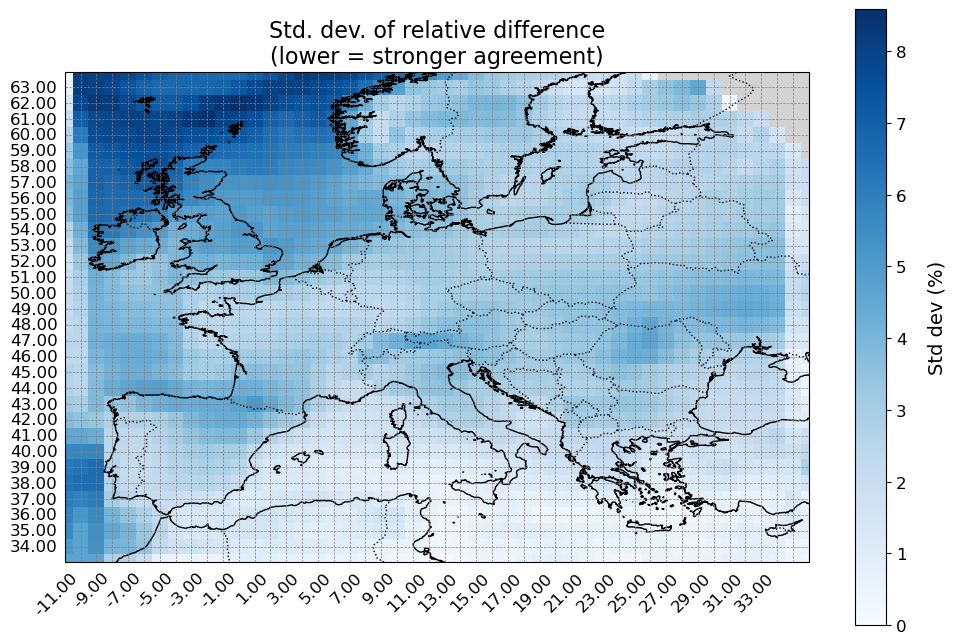

In [6]:
# Standard deviation
std_rel = all_rel.std(dim="model")

map_plots(
    std_rel, setnan=True,
    cmap="Blues",
    vmin=0, vmax=std_rel.max(),
    title="Std. dev. of relative difference\n(lower = stronger agreement)",
    label="Std dev (%)"
)

In [9]:
std_rel.mean()

<xarray.DataArray 'specific generation' ()> Size: 8B
array(3.09257363)

/home/s233224/anaconda3/envs/atlite_cmip6_2025/lib/python3.13/site-packages/numpy/lib/_nanfunctions_impl.py:1650: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a,


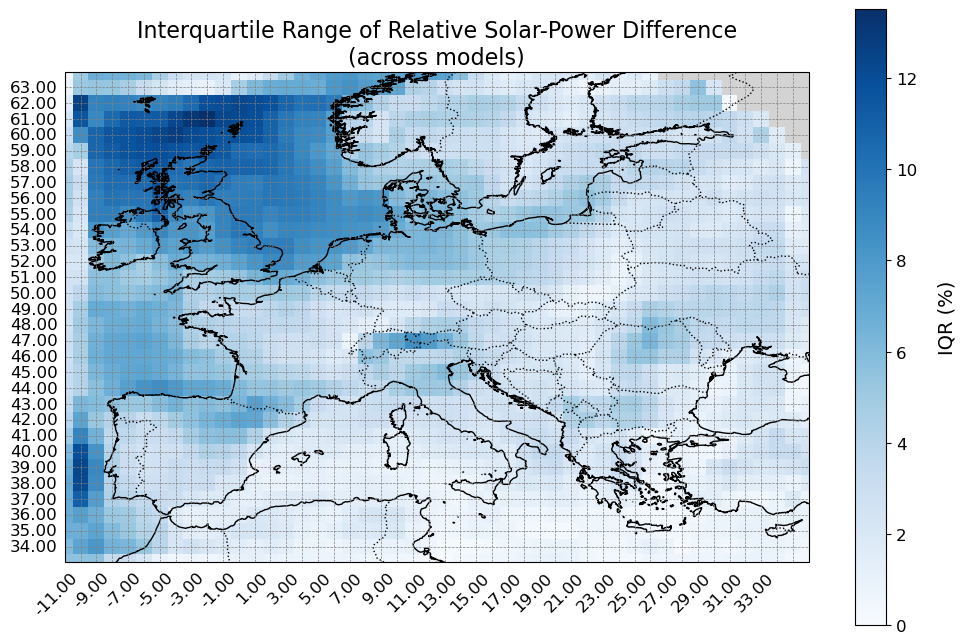

In [7]:
# 1. Combine all per-model maps into one DataArray along a new "model" dimension
combined = xr.concat(
    [relative_differences[m] for m in models],
    dim="model"
).assign_coords(model=("model", models))

# 2. Compute the 25th and 75th percentiles across models (at each grid cell)
q1 = combined.quantile(0.25, dim="model", skipna=True)
q3 = combined.quantile(0.75, dim="model", skipna=True)

# 3. IQR map (still in “%” since your rel diffs are already multiplied by 100)
iqr_map = q3 - q1

# 4. Choose bounds for plotting (you can also hard-code sensible vmin/vmax)
vmin, vmax = float(iqr_map.min()), float(iqr_map.max())

# 5. Plot
map_plots(
    iqr_map,
    cmap="Blues",      # reversed-blue works well
    setnan=True,
    vmin=vmin, 
    vmax=vmax,
    title="Interquartile Range of Relative Solar-Power Difference\n(across models)",
    label="IQR (%)"
)

In [10]:
iqr_map.mean()

<xarray.DataArray 'specific generation' ()> Size: 8B
array(3.90697448)

/tmp/ipykernel_42980/130309492.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = mpl.cm.get_cmap('RdBu_r').copy()


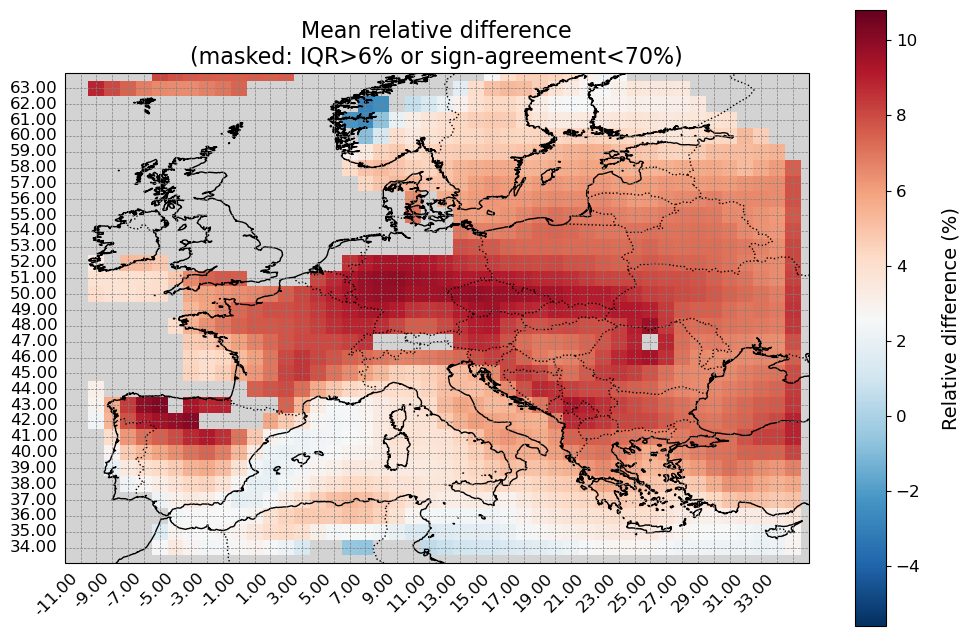

In [11]:
import matplotlib as mpl
robust_mask = (iqr_map <= 6) & (sign_agreement_pct >= 70)

# --- 5) Mask the mean field
masked_mean = mean_rel_diff.where(robust_mask)

# --- 6) Prepare a colormap that shows everything else as grey
cmap = mpl.cm.get_cmap('RdBu_r').copy()
cmap.set_bad(color='lightgrey')   # masked cells will appear grey
q0, q995 = np.nanpercentile(mean_rel_diff, [0, 99.5])

# --- 7) Plot
map_plots(
    masked_mean,
    cmap=cmap,
    setnan=True,
    vmin=q05,       # your previously computed 0.5th percentile
    vmax=q995,      # your previously computed 99.5th percentile
    title="Mean relative difference\n(masked: IQR>6% or sign-agreement<70%)",
    label="Relative difference (%)"
)


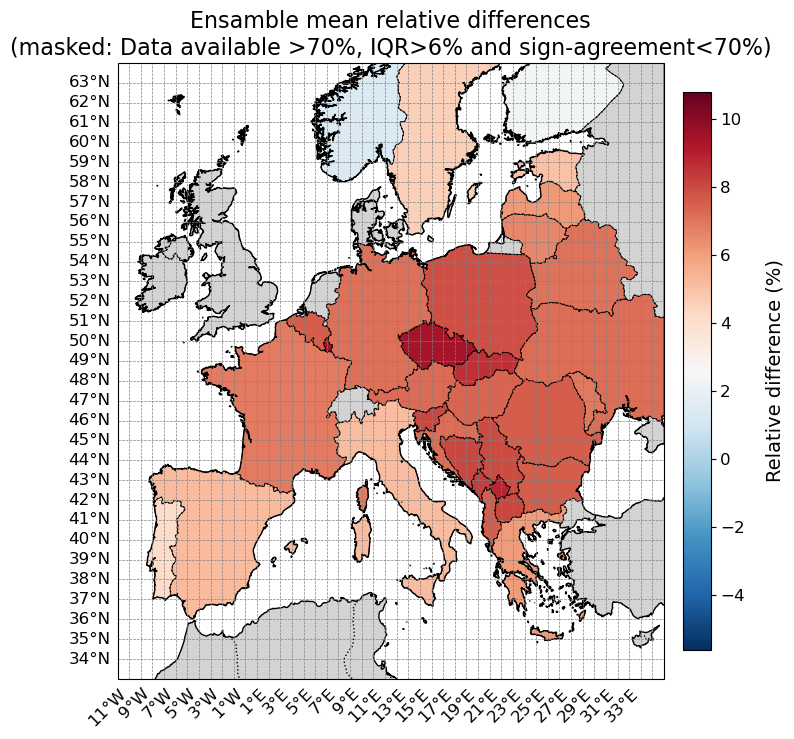

In [12]:
from plots import country_plots_weighted
country_plots_weighted(masked_mean, 'RdBu_r', vmin=q05, vmax=q995, title="Ensamble mean relative differences\n(masked: Data available >70%, IQR>6% and sign-agreement<70%)", label="Relative difference (%)", missing_frac_thresh=0.7)

In [13]:
# ── USER SETTINGS ─────────────────────────────────────────────────────────────
models   = ["ACCESS-CM2","CanESM5","CMCC-CM2-SR5","CMCC-ESM2",
            "HadGEM3-GC31-LL","HadGEM3-GC31-MM","MRI-ESM2-0"]
base_dir = "/work/users/s233224/Climate-Change-Impacted-Solar-Energy-Generation/power"
tol      = 5.0   # ±5 % for magnitude‐agreement
# ──────────────────────────────────────────────────────────────────────────────

# 1) Load seasonal‐means and compute Δ% per model, then convert to DataArray
rel_diff = {}
for model in models:
    boc_files = [
        os.path.join(base_dir, f"{model}_1x1grid/historical/aggregated_solar_power_seasons_{yr}.nc")
        for yr in range(1980, 2015)
    ]
    eoc_files = [
        os.path.join(base_dir, f"{model}_1x1grid/ssp585/aggregated_solar_power_seasons_{yr}.nc")
        for yr in range(2065, 2100)
    ]

    ds_boc = xr.concat(
        [xr.open_dataset(f).expand_dims(time=[yr]) for yr,f in zip(range(1980,2015), boc_files)],
        dim="time"
    )
    ds_eoc = xr.concat(
        [xr.open_dataset(f).expand_dims(time=[yr]) for yr,f in zip(range(2065,2100), eoc_files)],
        dim="time"
    )

    # compute the relative‐difference Dataset
    ds_rel = (ds_eoc.mean("time") - ds_boc.mean("time")) / ds_boc.mean("time") * 100

    # convert to a single DataArray with a "season" dimension
    rel_diff[model] = ds_rel.to_array(dim="season")
    # now rel_diff[model].dims == ("season", "y", "x")

# 2) Dynamically pull the season names from the new coordinate
seasons = list(rel_diff[models[0]].season.values)
print("Seasons found:", seasons)


Seasons found: ['Winter', 'Spring', 'Summer', 'Autumn']


/home/s233224/anaconda3/envs/atlite_cmip6_2025/lib/python3.13/site-packages/numpy/lib/_nanfunctions_impl.py:1650: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a,
/home/s233224/anaconda3/envs/atlite_cmip6_2025/lib/python3.13/site-packages/numpy/lib/_nanfunctions_impl.py:1650: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a,
/home/s233224/anaconda3/envs/atlite_cmip6_2025/lib/python3.13/site-packages/numpy/lib/_nanfunctions_impl.py:1650: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a,
/home/s233224/anaconda3/envs/atlite_cmip6_2025/lib/python3.13/site-packages/numpy/lib/_nanfunctions_impl.py:1650: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a,
/home/s233224/anaconda3/envs/atlite_cmip6_2025/lib/python3.13/site-packages/numpy/lib/_nanfunctions_impl.py:1650: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a,
/home/s233224/anaconda3/envs/atlite_cmip6_2025/lib/python3.13/site-packages/numpy/lib/_nanfunct

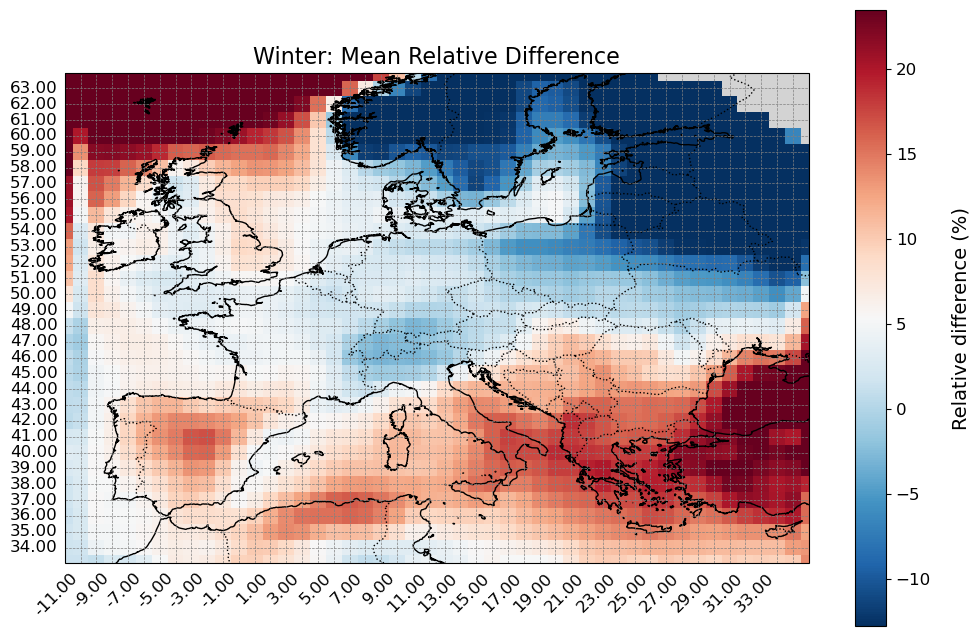

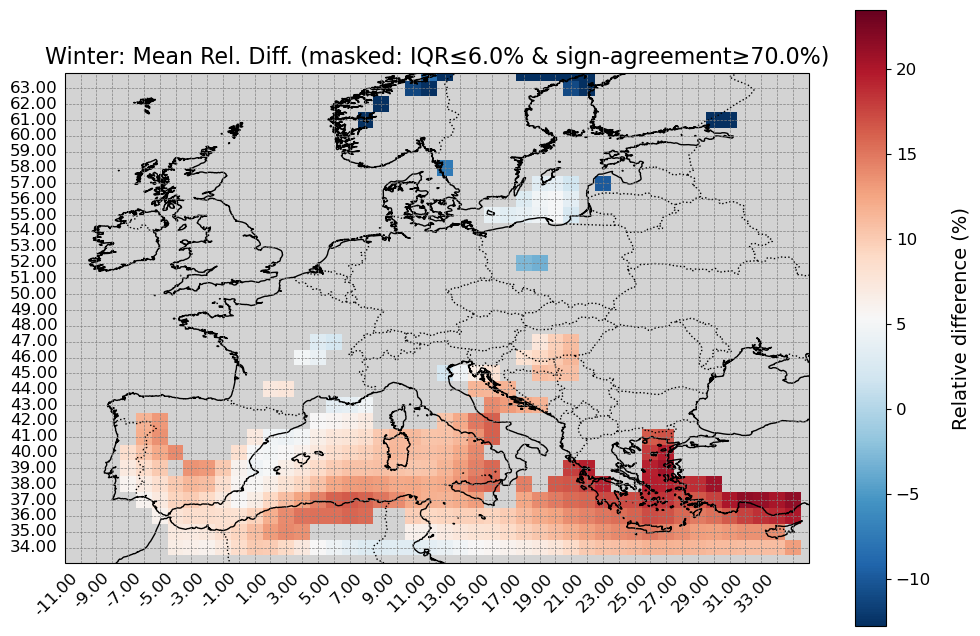

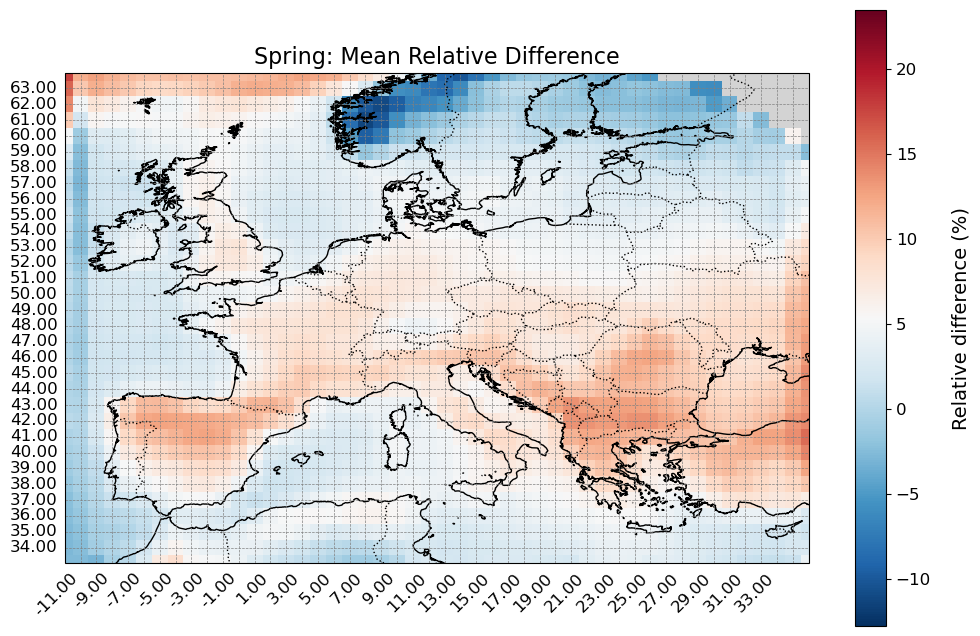

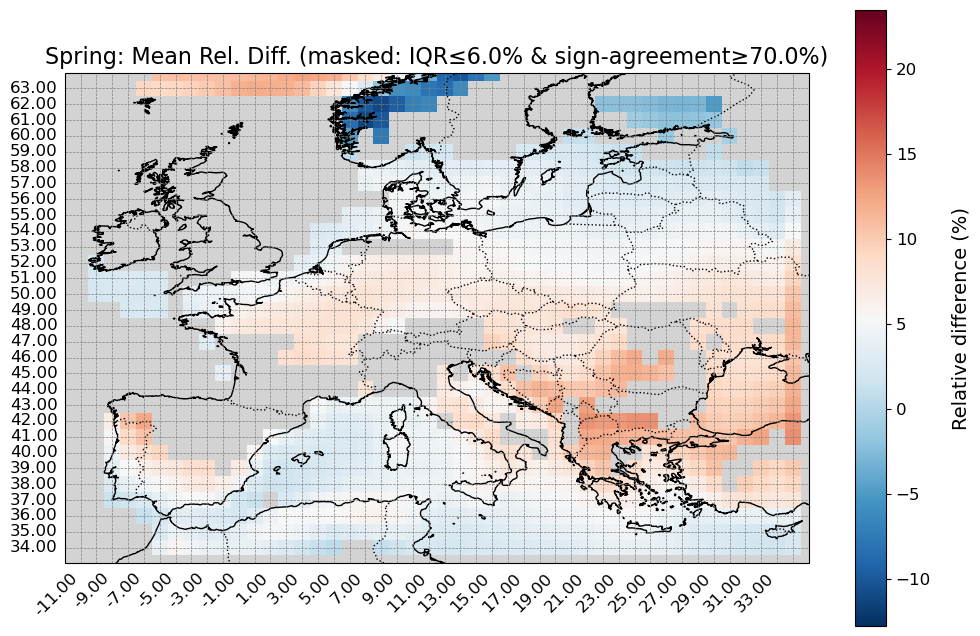

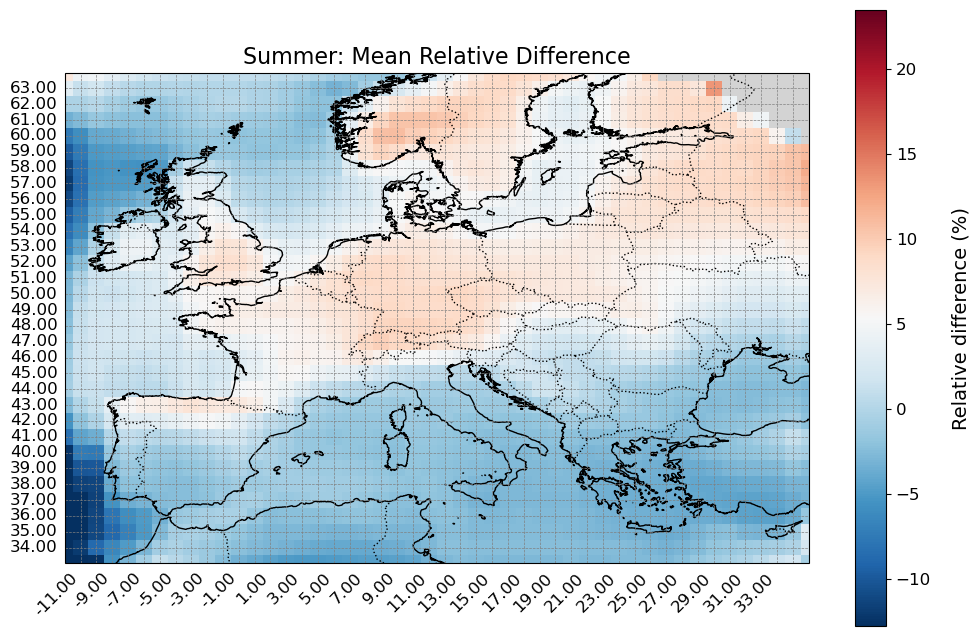

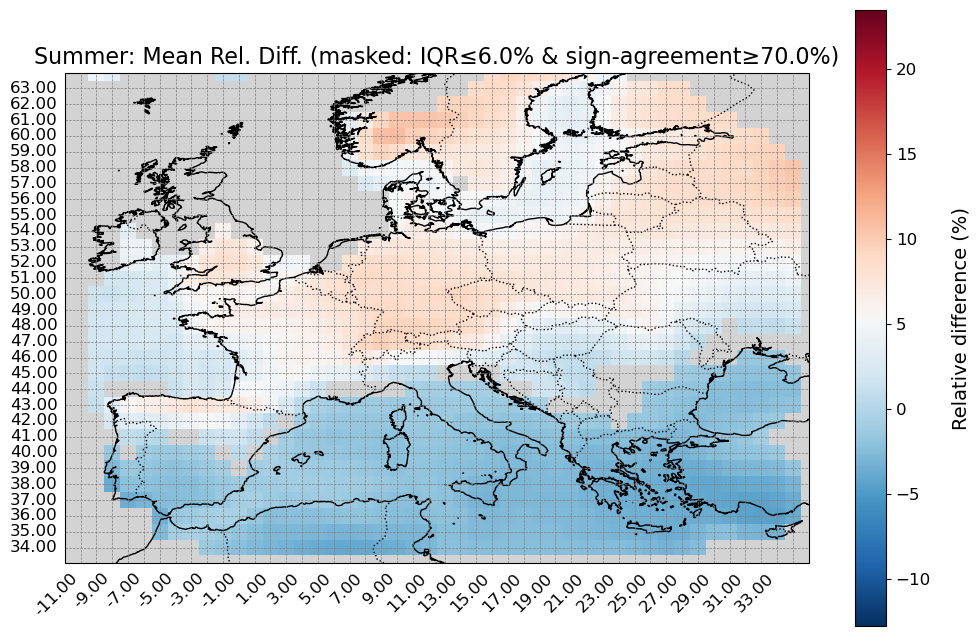

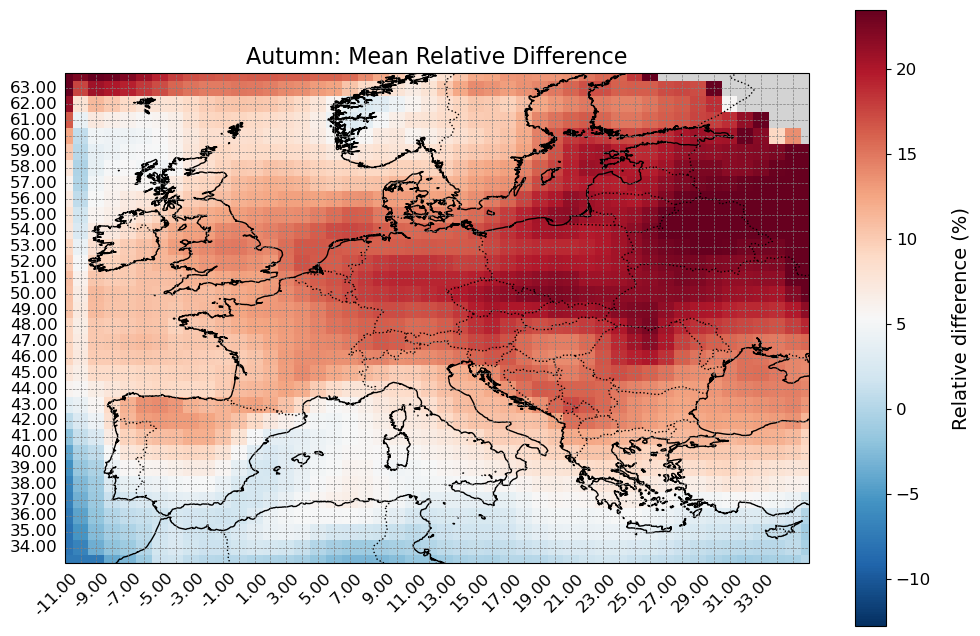

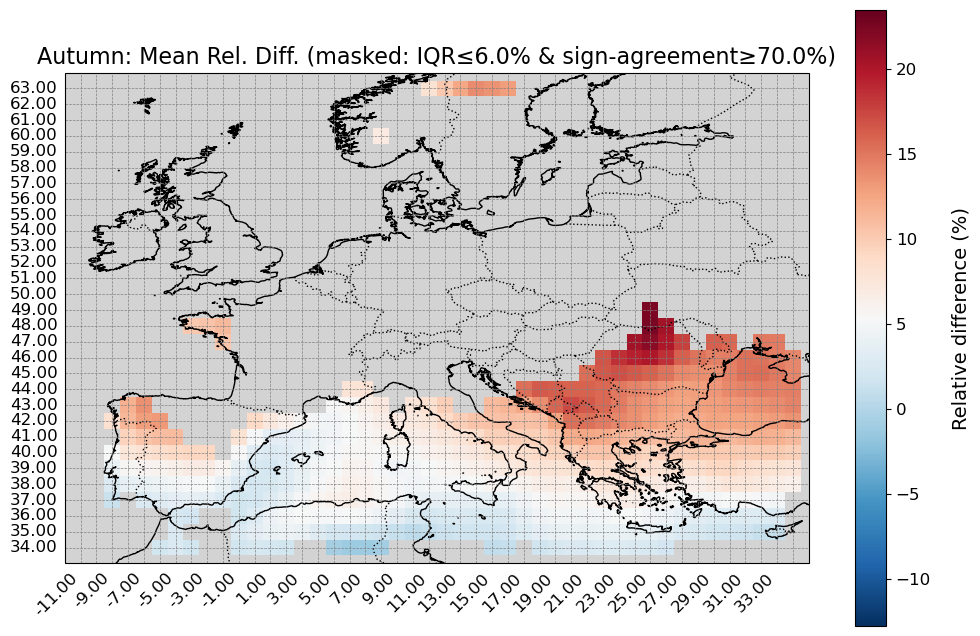

In [18]:
import os
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib as mpl
from plots import map_plots

# ── USER SETTINGS ─────────────────────────────────────────────────────────────
models    = ["ACCESS-CM2","CanESM5","CMCC-CM2-SR5","CMCC-ESM2",
             "HadGEM3-GC31-LL","HadGEM3-GC31-MM","MRI-ESM2-0"]
base_dir  = "/work/users/s233224/Climate-Change-Impacted-Solar-Energy-Generation/power"
tol       = 5.0    # ±5 % for magnitude‐agreement
iqr_tol   = 6.0    # ≤6 % interquartile‐range tolerance
sign_tol  = 70.0   # ≥70 % sign‐agreement tolerance
# ──────────────────────────────────────────────────────────────────────────────

# assume rel_diff[model] is a DataArray with dims ("season","y","x")
# and a coordinate .season giving e.g. ["DJF","MAM","JJA","SON"]
seasons = list(rel_diff[models[0]].season.values)

# prepare dicts
ens_mean    = {}
sign_agree  = {}
mag_agree   = {}
std_dev     = {}
iqr_map     = {}
wide_spread = {}

for season in seasons:
    # stack models for this season
    all_rel = xr.concat(
        [rel_diff[m].sel(season=season) for m in models],
        dim=pd.Index(models, name="model")
    )
    # ensemble mean Δ%
    ens_mean[season] = all_rel.mean(dim="model")
    # sign agreement (% of models matching the ensemble‐mean sign)
    model_signs       = np.sign(all_rel)
    ens_sign          = np.sign(ens_mean[season])
    sign_agree[season] = (model_signs == ens_sign).sum(dim="model") / len(models) * 100
    # magnitude agreement (% within ±tol of the mean)
    mag_agree[season]  = (np.abs(all_rel - ens_mean[season]) <= tol).sum(dim="model") / len(models) * 100
    # standard deviation
    std_dev[season]    = all_rel.std(dim="model")
    # interquartile range
    q25                = all_rel.quantile(0.25, dim="model")
    q75                = all_rel.quantile(0.75, dim="model")
    iqr_map[season]    = q75 - q25
    # wide 5–95% spread
    p05, p95           = all_rel.quantile([0.05, 0.95], dim="model")
    wide_spread[season] = p95 - p05

# build robust‐agreement mask and masked means
masked_means = {
    season: ens_mean[season]
                 .where((iqr_map[season] <= iqr_tol) &
                        (sign_agree[season] >= sign_tol))
    for season in seasons
}

# compute color‐limits
stacked_raw   = xr.concat([ens_mean[s] for s in seasons],   dim=pd.Index(seasons, name="season"))
vmin_raw, vmax_raw = np.nanpercentile(stacked_raw.values, [3, 97])

stacked_mask = xr.concat([masked_means[s] for s in seasons], dim=pd.Index(seasons, name="season"))
vmin_mask, vmax_mask = np.nanpercentile(stacked_mask.values, [3, 97])
# --- combine limits so both raw & masked use the same scale ---
global_vmin = min(vmin_raw, vmin_mask)
global_vmax = max(vmax_raw, vmax_mask)

# prepare masked colormap
cmap_bad = mpl.cm.get_cmap("RdBu_r").copy()
cmap_bad.set_bad("lightgrey")

# plot per season
for season in seasons:
    # raw ensemble‐mean relative difference
    map_plots(
        ens_mean[season],
        setnan=False,
        cmap="RdBu_r",
        vmin=global_vmin, vmax=global_vmax,
        title=f"{season}: Mean Relative Difference",
        label="Relative difference (%)"
    )

    # masked ensemble‐mean relative difference
    map_plots(
        masked_means[season],
        setnan=True,
        cmap=cmap_bad,
        vmin=global_vmin, vmax=global_vmax,
        title=(
            f"{season}: Mean Rel. Diff. (masked: IQR≤{iqr_tol}% & "
            f"sign‐agreement≥{sign_tol}%)"
        ),
        label="Relative difference (%)"
    )


/home/s233224/anaconda3/envs/atlite_cmip6_2025/lib/python3.13/site-packages/numpy/lib/_nanfunctions_impl.py:1650: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a,
/home/s233224/anaconda3/envs/atlite_cmip6_2025/lib/python3.13/site-packages/numpy/lib/_nanfunctions_impl.py:1650: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a,
/home/s233224/anaconda3/envs/atlite_cmip6_2025/lib/python3.13/site-packages/numpy/lib/_nanfunctions_impl.py:1650: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a,
/home/s233224/anaconda3/envs/atlite_cmip6_2025/lib/python3.13/site-packages/numpy/lib/_nanfunctions_impl.py:1650: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a,
/tmp/ipykernel_42980/1988255028.py:35: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_bad = mp

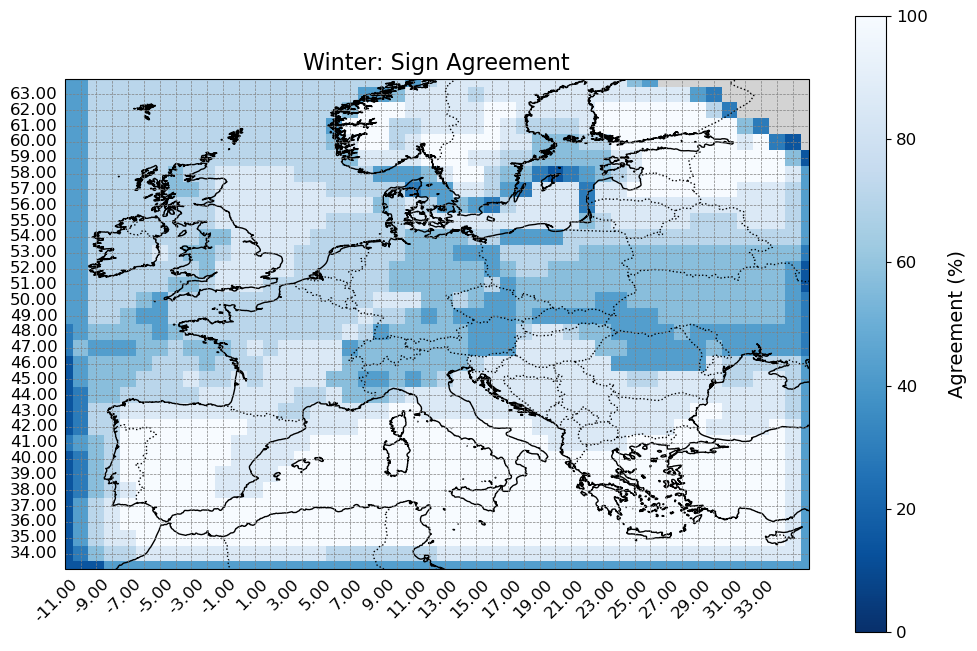

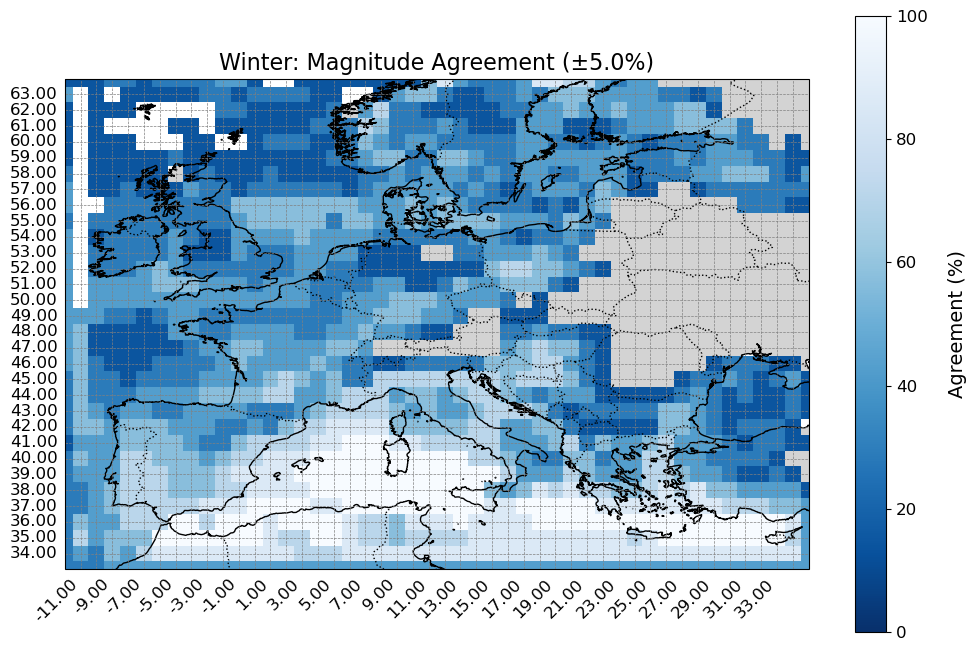

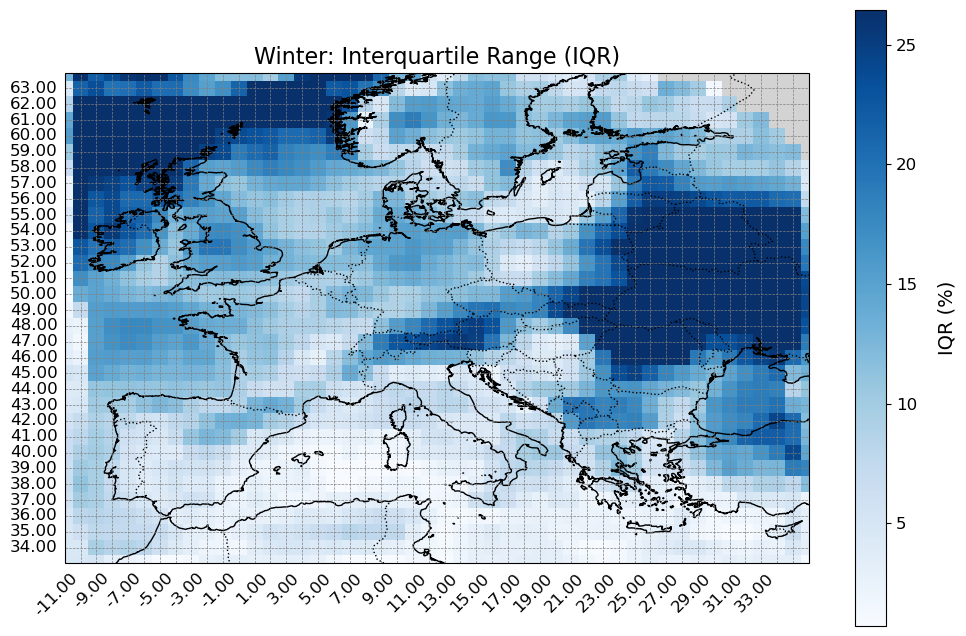

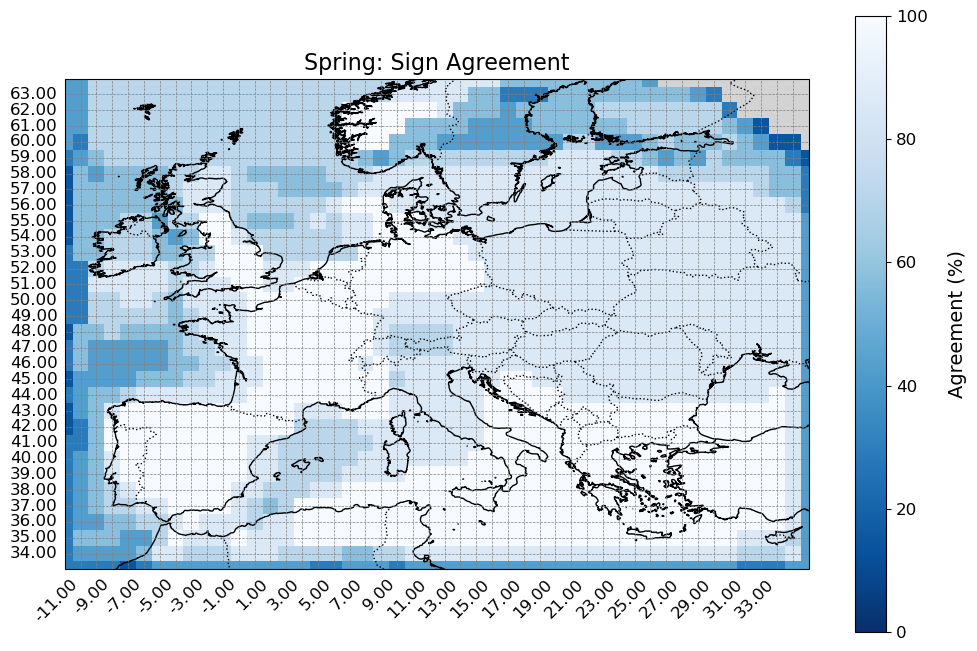

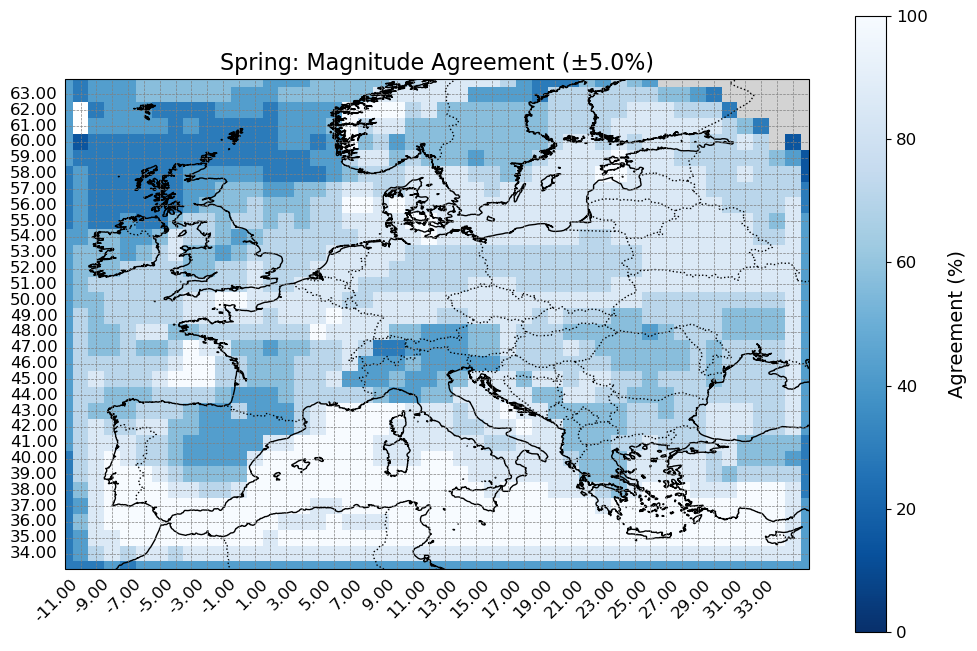

...

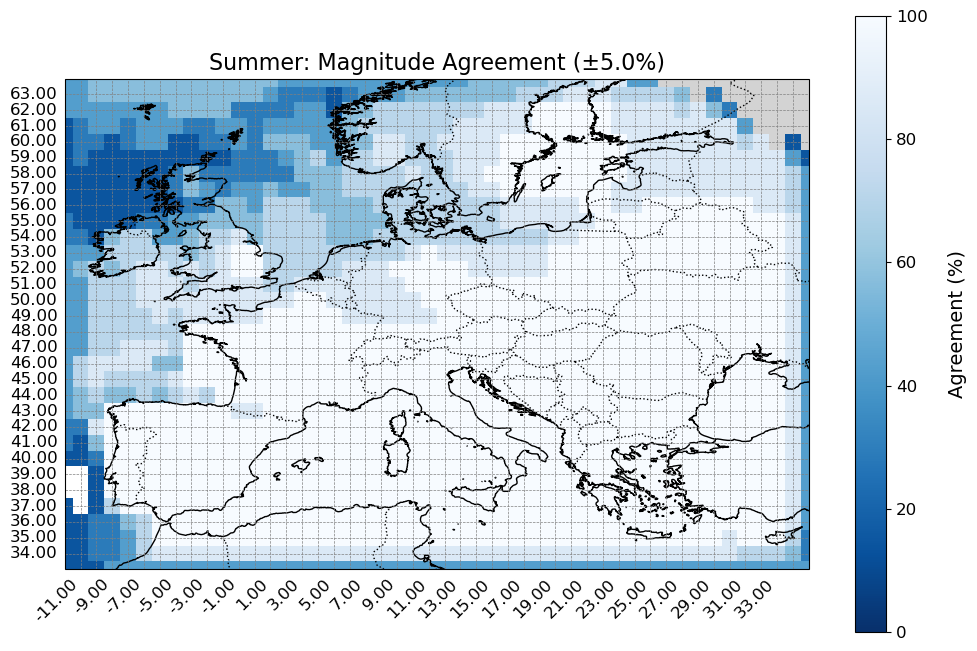

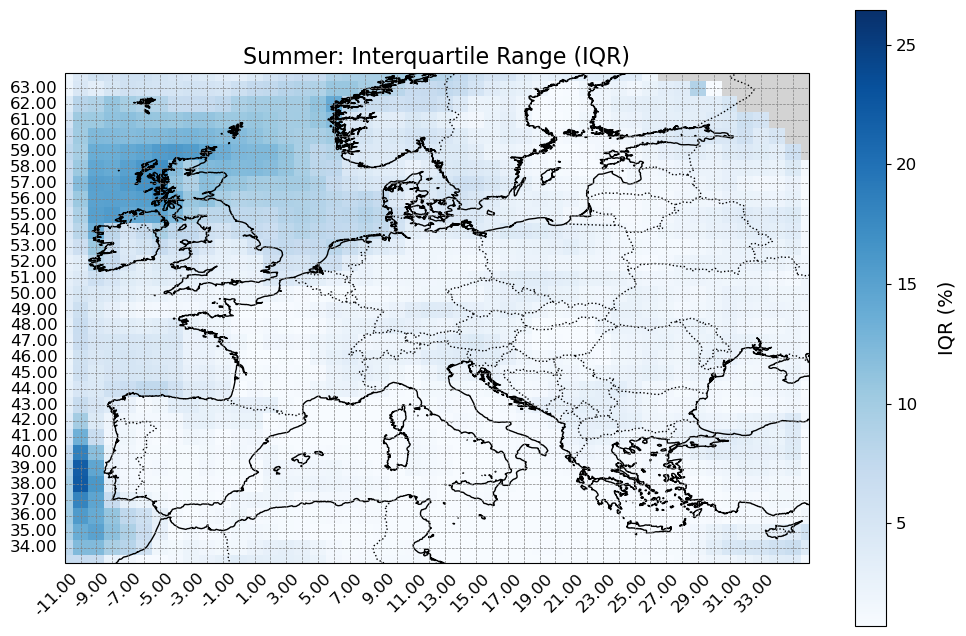

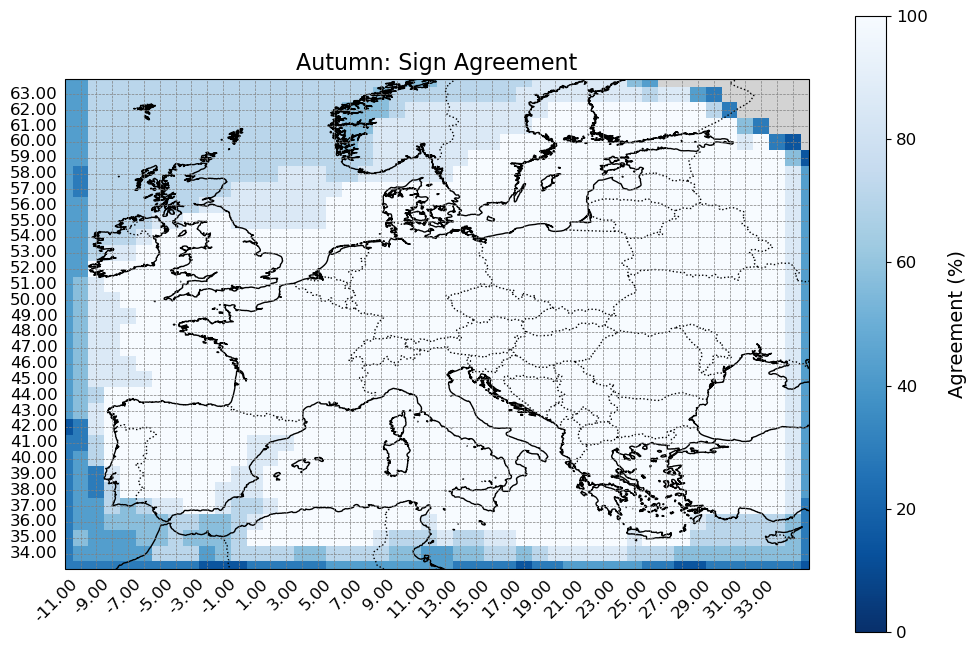

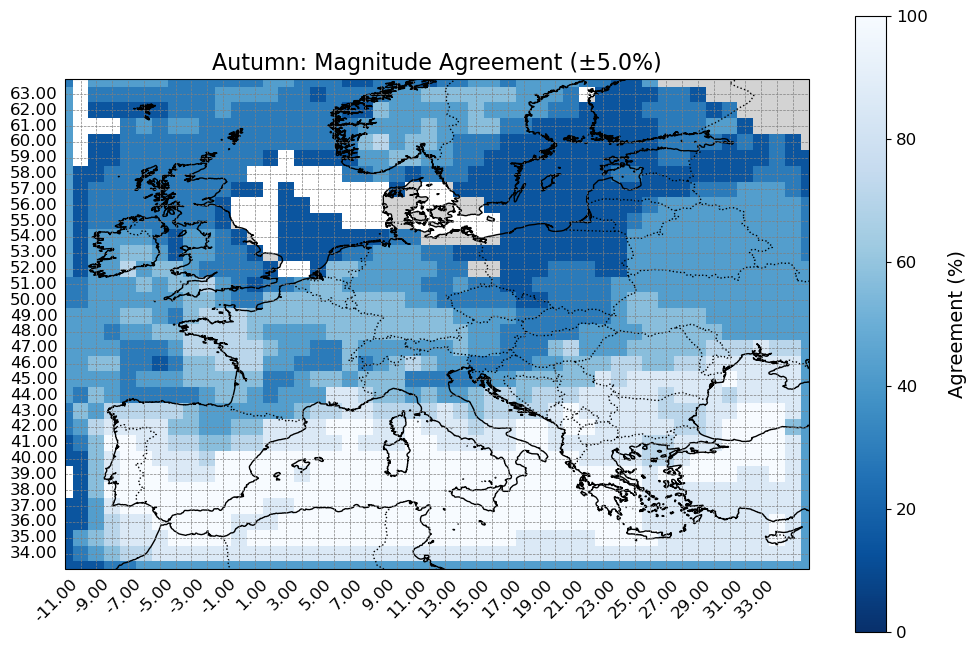

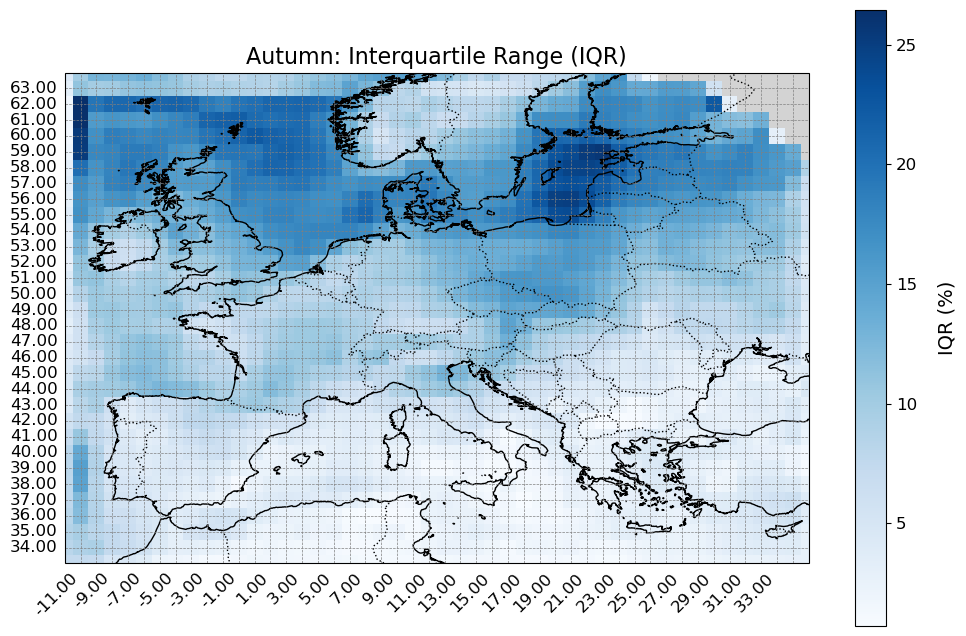

In [21]:
for season in seasons:
    # 1) stack all models along new "model" dimension
    all_rel = xr.concat(
        [rel_diff[m].sel(season=season) for m in models],
        dim=pd.Index(models, name="model")
    )

    # 3) sign agreement: % of models matching ensemble‐mean sign
    model_signs       = np.sign(all_rel)
    ens_sign          = np.sign(ens_mean[season])
    sign_agree[season] = (model_signs == ens_sign).sum(dim="model") / len(models) * 100

    # 4) magnitude agreement: % of models within ±tol of the mean
    mag_agree[season]  = (np.abs(all_rel - ens_mean[season]) <= tol) \
                             .sum(dim="model") / len(models) * 100

    # 5) IQR across models
    q25               = all_rel.quantile(0.25, dim="model")
    q75               = all_rel.quantile(0.75, dim="model")
    iqr_map[season]   = q75 - q25

# 7) Compute color‐limits for each metric (3rd–97th percentile)
def get_limits(dict_of_da):
    stacked = xr.concat(list(dict_of_da.values()),
                        dim=pd.Index(seasons, name="season"))
    return np.nanpercentile(stacked.values, [3, 97])

vmin_raw, vmax_raw   = get_limits(ens_mean)
vmin_mask, vmax_mask = get_limits(masked_means)
vmin_sign, vmax_sign = 0, 100
vmin_mag,  vmax_mag  = 0, 100
vmin_iqr,  vmax_iqr  = get_limits(iqr_map)

# 8) Prepare “bad data” colormap for masking
cmap_bad = mpl.cm.get_cmap("RdBu_r").copy()
cmap_bad.set_bad("lightgrey")

# 9) Plot all maps per season
for season in seasons:
    # c) sign agreement
    map_plots(
        sign_agree[season],
        setnan=True,
        cmap="Blues_r",
        vmin=vmin_sign, vmax=vmax_sign,
        title=f"{season}: Sign Agreement",
        label="Agreement (%)"
    )

    # d) magnitude agreement
    map_plots(
        mag_agree[season],
        setnan=True,
        cmap="Blues_r",
        vmin=vmin_mag, vmax=vmax_mag,
        title=f"{season}: Magnitude Agreement (±{tol}%)",
        label="Agreement (%)"
    )

    # e) interquartile range
    map_plots(
        iqr_map[season],
        setnan=True,
        cmap="Blues",
        vmin=vmin_iqr, vmax=vmax_iqr,
        title=f"{season}: Interquartile Range (IQR)",
        label="IQR (%)"
    )


In [ ]:
from shapely.geometry import box

import matplotlib as mpl
# ─────────────────────────────────────────────────────────────────────────────
# 1) PARAMETERS
models = [
    "ACCESS-CM2", "CanESM5", "CMCC-CM2-SR5", "CMCC-ESM2",
    "HadGEM3-GC31-LL", "HadGEM3-GC31-MM", "MRI-ESM2-0"
]
diri = "/work/users/s233224/Climate-Change-Impacted-Solar-Energy-Generation/power/"

# ─────────────────────────────────────────────────────────────────────────────
# 2) LOAD + COMPUTE GRID-CELL RELATIVE DIFFERENCES
relative_differences = {}
all_rel = []

for model in models:
    # historical
    boc = xr.concat([
        xr.open_dataset(os.path.join(diri, f"{model}_1x1grid/historical/aggregated_solar_power_{yr}.nc"))
          .expand_dims(time=[yr])
        for yr in range(1980, 2015)
    ], dim="time")
    mean_boc = boc["specific generation"].mean(dim="time")
    
    # future
    eoc = xr.concat([
        xr.open_dataset(os.path.join(diri, f"{model}_1x1grid/ssp585/aggregated_solar_power_{yr}.nc"))
          .expand_dims(time=[yr])
        for yr in range(2065, 2100)
    ], dim="time")
    mean_eoc = eoc["specific generation"].mean(dim="time")
    
    # percent change + subset
    rel = (mean_eoc - mean_boc) / mean_boc * 100
    rel = rel.sel(x=slice(-12, 35), y=slice(33, 65))
    
    relative_differences[model] = rel
    all_rel.append(rel)

# ─────────────────────────────────────────────────────────────────────────────
# 3) GLOBAL COLOR SCALE
ensemble_grid = xr.concat(list(relative_differences.values()), dim="model").mean(dim="model")


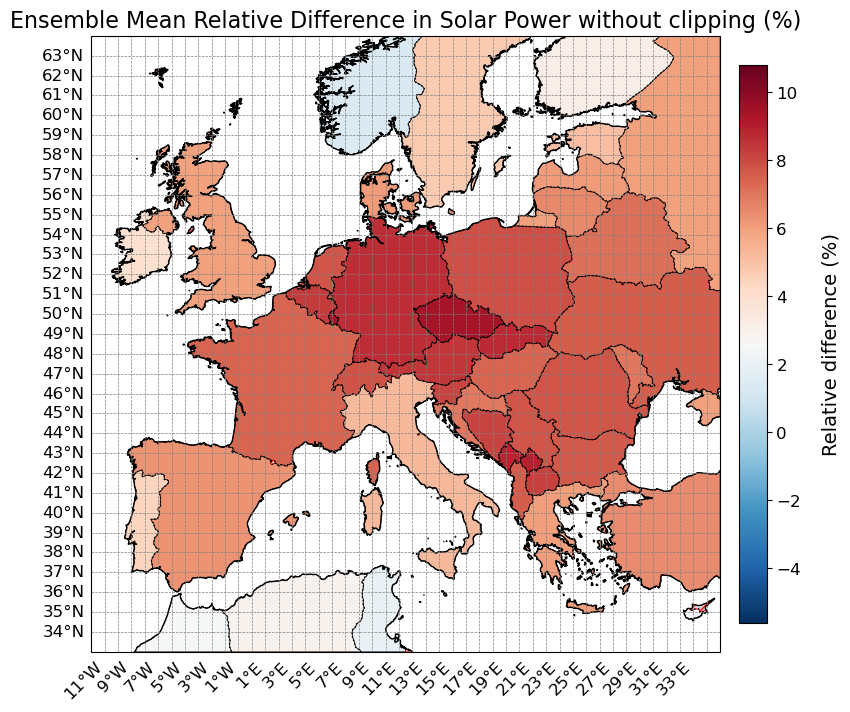

In [ ]:
from plots import country_plots
q05, q995 = np.nanpercentile(ensemble_grid.values.flatten(), [0.5, 99.5])
q0,q100 = np.nanpercentile(ensemble_grid.values, [0, 100])
vmin, vmax = q05,q995
country_plots(
    ensemble_grid,
    cmap='RdBu_r',
    vmin=vmin,
    vmax=vmax,
    title="Ensemble Mean Relative Difference in Solar Power without clipping (%)",
    label="Relative difference (%)",
    missing_frac_thresh=0.7
)


In [ ]:
models = ["ACCESS-CM2", "CanESM5", "CMCC-CM2-SR5", "CMCC-ESM2","HadGEM3-GC31-LL", "HadGEM3-GC31-MM", "MRI-ESM2-0"]  # Replace with actual model names
diri = "/work/users/s233224/Climate-Change-Impacted-Solar-Energy-Generation/power/"

# Initialize vmin and vmax
vmin = float("inf")
vmax = float("-inf")

# Dictionary to store relative differences for each model
relative_differences = {}
all_relative_differences = []

# Loop through each model
for model in models:
    # Define paths for BOC and EOC
    path_BOC = os.path.join(diri, model+"_1x1grid/historical/")
    print(path_BOC)
    path_EOC = os.path.join(diri, model+"_1x1grid/ssp585/")
    
    # Load BOC files
    files_BOC = [f"{path_BOC}aggregated_solar_power_{year}.nc" for year in range(1980, 2015)]
    datasets_BOC = []
    for year, file in zip(range(1980, 2015), files_BOC):
        ds_BOC = xr.open_dataset(file, engine="netcdf4")
        ds_BOC = ds_BOC.expand_dims(time=[year])
        datasets_BOC.append(ds_BOC)
    combined_ds_BOC = xr.concat(datasets_BOC, dim="time")
    mean_power_BOC = combined_ds_BOC["specific generation"].mean(dim="time")
    
    # Load EOC files
    files_EOC = [f"{path_EOC}aggregated_solar_power_{year}.nc" for year in range(2065, 2100)]
    datasets_EOC = []
    for year, file in zip(range(2065, 2100), files_EOC):
        ds_EOC = xr.open_dataset(file)
        ds_EOC = ds_EOC.expand_dims(time=[year])
        datasets_EOC.append(ds_EOC)
    combined_ds_EOC = xr.concat(datasets_EOC, dim="time")
    mean_power_EOC = combined_ds_EOC["specific generation"].mean(dim="time")

In [2]:
import os
import xarray as xr
import geopandas as gpd
import pandas as pd
import numpy as np
from shapely.geometry import box
from scipy.stats import shapiro, ttest_ind

# -----------------------------------------------------------------------------
# 1) CONFIGURATION
# -----------------------------------------------------------------------------
DIRI = "/work/users/s233224/Climate-Change-Impacted-Solar-Energy-Generation/power/"        # base folder with Model*_1x1grid/
models = ["ACCESS-CM2", "CMCC-CM2-SR5", "CMCC-ESM2","HadGEM3-GC31-LL", "HadGEM3-GC31-MM", "MRI-ESM2-0"] #removed  "CanESM5"
EU27 = ['AT','BE','BG','HR','CZ','DK','EE','FI','FR','DE','GR',
        'HU','IE','IT','LV','LT','LU','MT','NL','PL','PT','RO',
        'SK','SI','ES','SE', 'CY']        
years_BOC = range(1980, 2015)        # 1980–2014
years_EOC = range(2065, 2100)        # 2065–2099
data_var = 'specific generation'     # NetCDF variable name

# -----------------------------------------------------------------------------
# 2) BUILD 1°×1° GRID-CELL POLYGONS
# -----------------------------------------------------------------------------
# use a sample file to get lat/lon arrays
sample_fp = os.path.join(
    DIRI,
    f"{models[0]}_1x1grid/historical/aggregated_solar_power_{years_BOC[0]}.nc"
)
ds_sample = xr.open_dataset(sample_fp, engine='netcdf4')
lats = ds_sample['lat'].values
lons = ds_sample['lon'].values
ds_sample.close() #take the coordinates of a sample file

dlat = float(np.diff(lats).mean())
dlon = float(np.diff(lons).mean())

cells = []
for lat in lats:
    for lon in lons:
        cells.append({
            'lon': float(lon),
            'lat': float(lat),
            'geometry': box(lon - dlon/2,
                            lat - dlat/2,
                            lon + dlon/2,
                            lat + dlat/2)
        })
gdf_cells = gpd.GeoDataFrame(cells, crs="EPSG:4326")

# -----------------------------------------------------------------------------
# 3) LOAD & FILTER EUROPEAN COUNTRIES
# -----------------------------------------------------------------------------
ne50 = (
    "https://naturalearth.s3.amazonaws.com/50m_cultural/"
    "ne_50m_admin_0_countries.zip"
)
world = gpd.read_file(ne50).to_crs("EPSG:4326")
# Force France’s ISO_A2 to 'FR'
world.loc[world['NAME_LONG']=='France', 'ISO_A2'] = 'FR'
# Then filter:
eu = world[world['ISO_A2'].isin(EU27)][['ISO_A2','geometry']].copy()


# -----------------------------------------------------------------------------
# 4) INTERSECT & COMPUTE GRID-CELL WEIGHTS
# -----------------------------------------------------------------------------
proj_crs = "EPSG:3035"
cells_pa = gdf_cells.to_crs(proj_crs)
cells_pa['cell_area'] = cells_pa.geometry.area
eu_pa = eu.to_crs(proj_crs)

inter = gpd.overlay(cells_pa, eu_pa, how='intersection')
inter['overlap_area'] = inter.geometry.area
inter['weight'] = inter['overlap_area'] / inter['cell_area']
inter = inter[['lon','lat','ISO_A2','weight']].reset_index(drop=True)

# -----------------------------------------------------------------------------
# 5) HELPER: SUM-WEIGHTED AGGREGATION TO COUNTRY
# -----------------------------------------------------------------------------
def country_aggregated(da, inter_gdf):
    """
    da: xarray.DataArray indexed by (lat, lon) of annual total generation
    inter_gdf: GeoDataFrame with ['lon','lat','ISO_A2','weight']
    Returns: Series indexed by ISO_A2 with summed country totals
    """
    df = da.to_dataframe(name='P').reset_index()  # lat, lon, P
    df = df.merge(inter_gdf, on=['lon','lat'], how='inner')
    df['contrib'] = df['P'] * df['weight']
    return df.groupby('ISO_A2')['contrib'].sum()

# -----------------------------------------------------------------------------
# 6) LOOP MODELS & YEARS → RECORD PER-YEAR TOTALS
# -----------------------------------------------------------------------------
records = []

for model in models:
    # BOC years
    boc_dir = os.path.join(DIRI, f"{model}_1x1grid/historical/")
    for yr in years_BOC:
        fp = os.path.join(boc_dir, f"aggregated_solar_power_{yr}.nc")
        ds = xr.open_dataset(fp, engine='netcdf4')
        da = ds[data_var]  # dims (lat, lon)
        ct = country_aggregated(da, inter)
        ds.close()
        for iso, val in ct.items():
            records.append({
                'model':   model,
                'period':  'BOC',
                'year':    yr,
                'ISO_A2':  iso,
                'value':   float(val)
            })

    # EOC years
    eoc_dir = os.path.join(DIRI, f"{model}_1x1grid/ssp585/")
    for yr in years_EOC:
        fp = os.path.join(eoc_dir, f"aggregated_solar_power_{yr}.nc")
        ds = xr.open_dataset(fp, engine='netcdf4')
        da = ds[data_var]
        ct = country_aggregated(da, inter)
        ds.close()
        for iso, val in ct.items():
            records.append({
                'model':   model,
                'period':  'EOC',
                'year':    yr,
                'ISO_A2':  iso,
                'value':   float(val)
            })

df = pd.DataFrame.from_records(records)

# -----------------------------------------------------------------------------
# 7) STATISTICAL TESTS: SHAPIRO & WELCH T-TEST PER COUNTRY
# -----------------------------------------------------------------------------
results = []
for iso in EU27:
    boc_vals = df.loc[
        (df.ISO_A2 == iso) & (df.period == 'BOC'),
        'value'
    ].values
    eoc_vals = df.loc[
        (df.ISO_A2 == iso) & (df.period == 'EOC'),
        'value'
    ].values

    # Shapiro–Wilk normality tests
    _, p_shapiro_boc = shapiro(boc_vals)
    _, p_shapiro_eoc = shapiro(eoc_vals)
    # Welch’s t-test
    _, p_ttest = ttest_ind(eoc_vals, boc_vals, equal_var=False)

    # Means & relative change
    m_b = boc_vals.mean()
    m_e = eoc_vals.mean()
    rel = (m_e - m_b) / m_b * 100

    results.append({
        'ISO_A2':        iso,
        #'n_BOC':         len(boc_vals),
        #'n_EOC':         len(eoc_vals),
        'mean_BOC (kWh/kWp)':      m_b,
        'mean_EOC (kWh/kWp)':      m_e,
        'rel_change_%':  rel,
        'p_shapiro_BOC': p_shapiro_boc,
        'p_shapiro_EOC': p_shapiro_eoc,
        'p_ttest':       p_ttest
    })

results_df = pd.DataFrame(results).set_index('ISO_A2')
print(results_df)
results_df.to_csv('solar_country_stats2.csv')

        mean_BOC (kWh/kWp)  mean_EOC (kWh/kWp)  rel_change_%  p_shapiro_BOC  \
ISO_A2                                                                        
AT             9446.549088        10348.050591      9.543183   1.289592e-10   
BE             3093.646285         3380.584593      9.275085   7.573120e-09   
BG            13157.605189        14269.230877      8.448541   3.240525e-11   
HR             6422.852021         6950.854362      8.220684   4.141427e-10   
CZ             8038.311811         8896.401090     10.674994   2.150835e-09   
DK             4646.626250         4959.637345      6.736309   8.023876e-10   
EE             5130.537994         5421.179268      5.664928   1.089942e-08   
FI            13476.210022        13997.667841      3.869469   2.585362e-06   
FR            63043.783612        68146.809281      8.094415   1.990224e-11   
DE            36283.489169        39757.045339      9.573380   8.740384e-10   
GR            17161.564559        18272.974110      

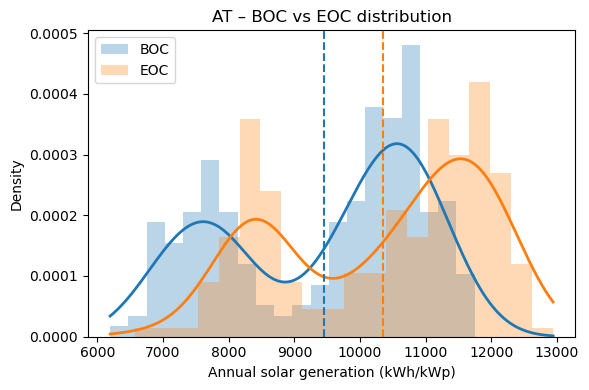

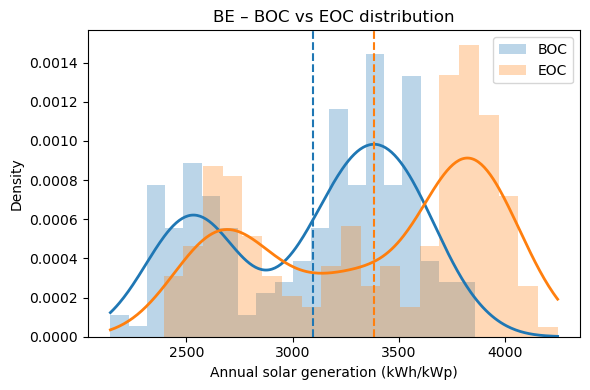

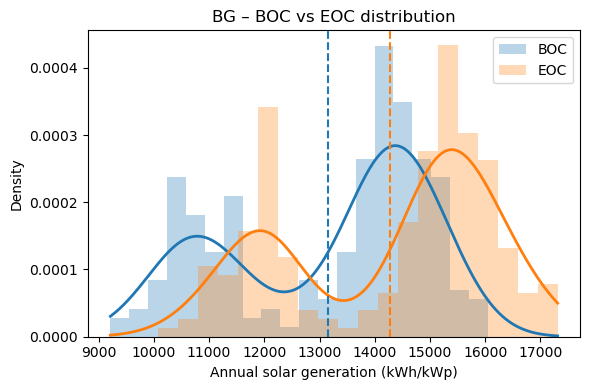

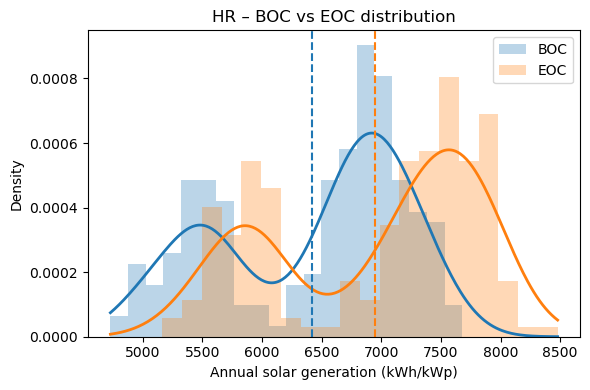

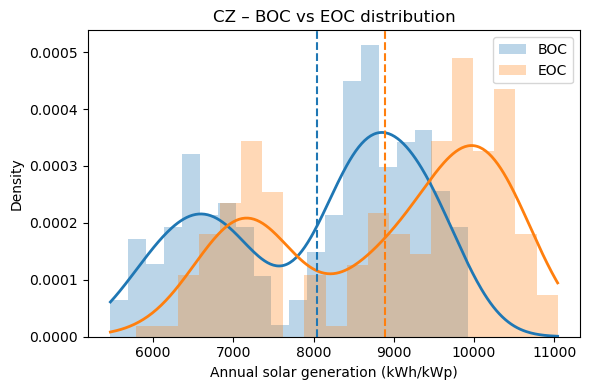

...

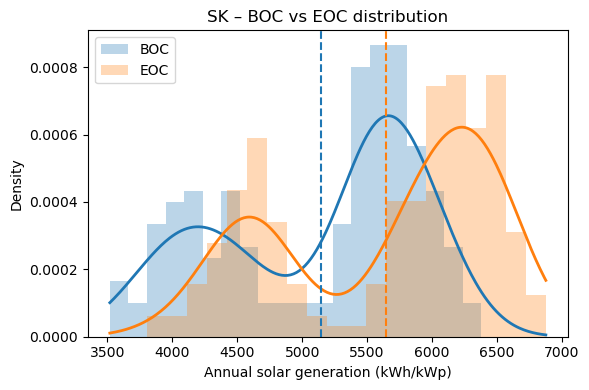

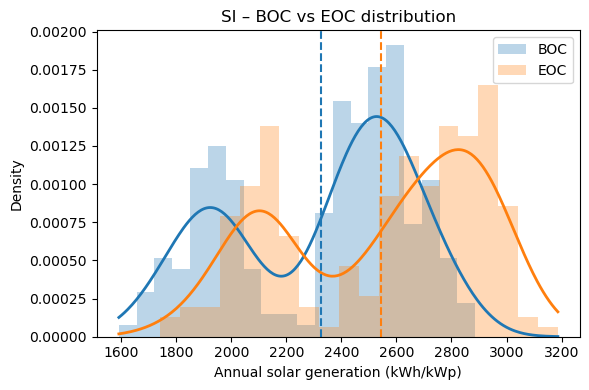

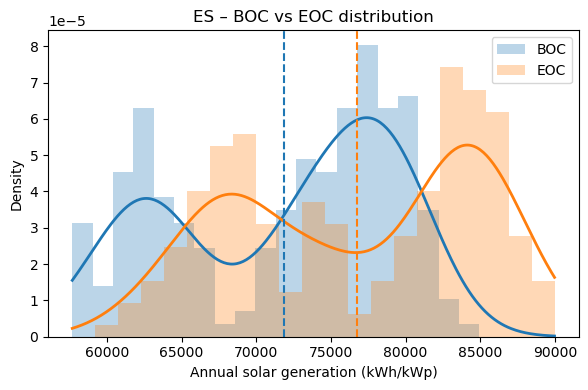

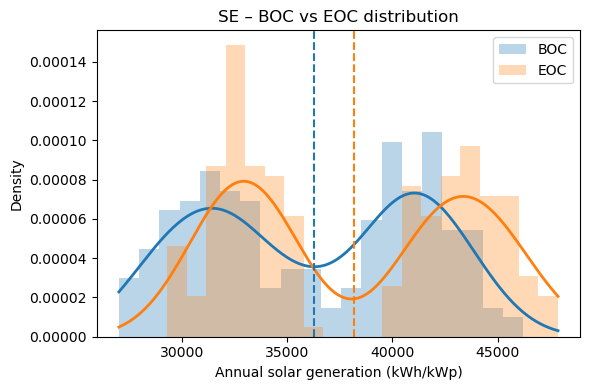

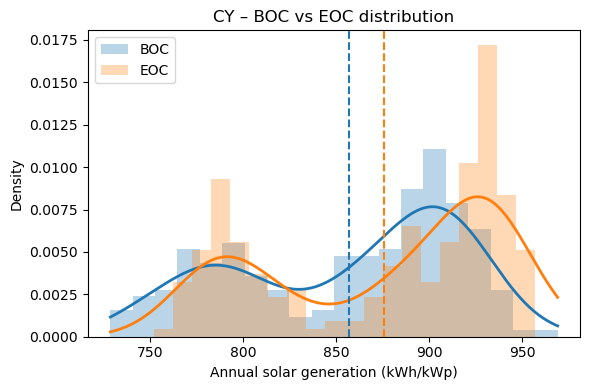

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

boc_color = 'tab:blue'
eoc_color = 'tab:orange'

for iso in EU27:
    boc_vals = df.loc[(df.ISO_A2==iso)&(df.period=='BOC'), 'value'].values
    eoc_vals = df.loc[(df.ISO_A2==iso)&(df.period=='EOC'), 'value'].values

    if len(boc_vals)==0 or len(eoc_vals)==0:
        continue

    xs = np.linspace(min(boc_vals.min(), eoc_vals.min()),
                     max(boc_vals.max(), eoc_vals.max()), 300)

    kde_boc = gaussian_kde(boc_vals)
    kde_eoc = gaussian_kde(eoc_vals)

    plt.figure(figsize=(6,4))
    # histograms
    plt.hist(boc_vals, bins=20, density=True,
             color=boc_color, alpha=0.3, label='BOC')
    plt.hist(eoc_vals, bins=20, density=True,
             color=eoc_color, alpha=0.3, label='EOC')
    # KDE curves
    plt.plot(xs, kde_boc(xs), color=boc_color, lw=2)
    plt.plot(xs, kde_eoc(xs), color=eoc_color, lw=2)
    # means
    plt.axvline(boc_vals.mean(), color=boc_color,
                linestyle='--', lw=1.5)
    plt.axvline(eoc_vals.mean(), color=eoc_color,
                linestyle='--', lw=1.5)

    plt.title(f'{iso} – BOC vs EOC distribution')
    plt.xlabel('Annual solar generation (kWh/kWp)')
    plt.ylabel('Density')
    plt.legend()
    plt.tight_layout()
    plt.show()
